# Quantum Annealing with Custom Convex Functions


In [ ]:
from main import CustomConvexFunction, run_simulation
from helpers import (
    plot_energy, plot_ground_state, 
    ground_state_animation, plot_gap, plot_min_gap
)
from IPython.display import HTML
import numpy as np

np.set_printoptions(legacy='1.25')

## 1. Convex Function Definition

Define a convex function $f: \{0,1\}^n \rightarrow \mathbb{R}$ for optimization.
The function can be defined either:
- On the hypercube (bitstring basis)
- On the line (Hamming weight basis)

Example: Quadratic function centered at n/2

Define the function $f: \{0;1\}^n \rightarrow \mathbb{R}$ to optimize inside a quantum annealing framework. 
Here $f$ can either be defined on the hypercube or on the line i.e. on the Hamming weight basis

In [2]:
def my_convex_function(x, params):
    """Custom convex function for optimization.
    
    Args:
        x: Input state (integer for Hamming weight basis, list for bitstring basis)
        params: Dictionary containing 'n' and other parameters
    """
    n = params['n']
    alpha = params.get('alpha', 1.0)
    
    if isinstance(x, list):  # bitstring basis
        hw = sum(x)
        return (hw - n/4)**2 * alpha
    else:  # Hamming weight basis
        return (x - n/4)**2 * alpha

# Create function object with parameters
custom_func = CustomConvexFunction(
    func=my_convex_function,
    params={'alpha': 2.0},
    name='quadratic'
)



## 2. Quantum Annealing Simulation

The quantum annealing Hamiltonian takes the form:

In bitstring basis:
$H(s) = -(1-s)\sum_i X_i + s\sum_{x \in \{0,1\}^n} f(x) |x\rangle\langle x|$

In Hamming weight basis:
$H(s) = -(1-s)A + s\sum_{k \in [n]} f(k) |k\rangle\langle k|$

where $A_{k,k+1} = A_{k+1,k} = \sqrt{k(n+1-k)}$

In [3]:
# Run quantum annealing simulation
results = run_simulation(
    n_min=5,
    n_max=5,
    custom_func=custom_func,
    use_hw_basis=True,  # use Hamming weight basis
    num_points=500,     # number of time points
    save_results=True,  # save results to file
    sim_params={'gamma': 1.0}  # additional simulation parameters
)

Processing N=5


/Users/eliebermot/Documents/gibbs_sampling/log_concave_ground_state/main.py:259: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block0_values] [items->Index(['ground_state_energy', 'first_excited_energy', 'energies', 'bitstrings',
       'ground_vectors', 'gap', 'potential', 'G0', 'G1', 'parameters',
       'times'],
      dtype='object')]

  df.to_hdf(os.path.join(output_dir, filename), key='hamil')


## 3. Analysis and Visualization

### 3.1 Energy Spectrum

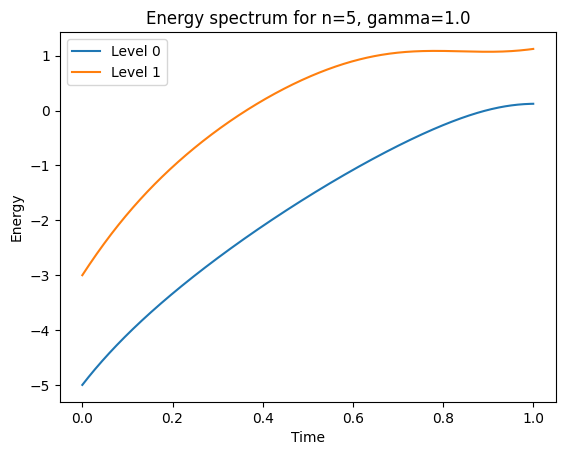

In [4]:
plot_energy(
    energies=results['energies'][0],  # last system size
    n=5,
    levels_to_show=np.arange(2), 
    problem=custom_func.name,
    title_params={'gamma': 1.0}
)

### 3.2 Ground State Evolution

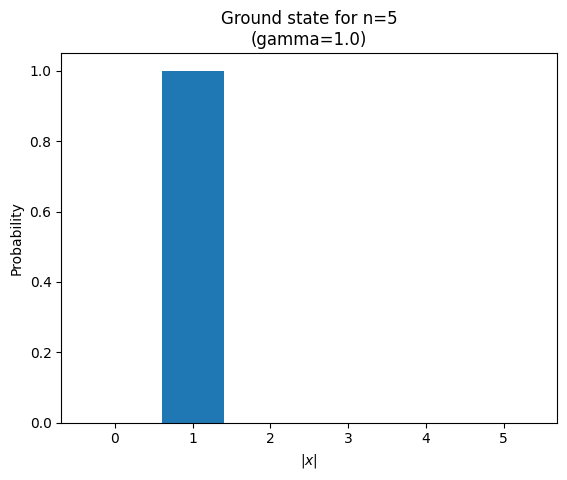

Generating frames...


MovieWriter ffmpeg unavailable; using Pillow instead.


Created 500 frames
Creating animation...
Cleaning up temporary files...


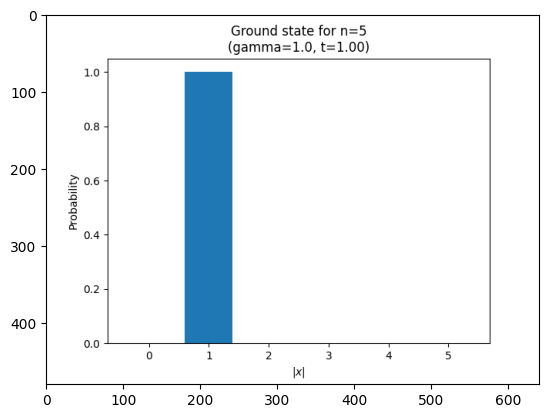

In [5]:

# Plot final ground state
plot_ground_state(
    amp=results['ground_vectors'][-1][-1],  # last time point of last system
    n=5,
    problem=custom_func.name,
    prob=True,  # plot probabilities instead of amplitudes
    dir_path='./plots/',
    sim_params={'gamma': 1.0}
)

# Create and display ground state evolution animation
anim = ground_state_animation(
    ground_vectors= results['ground_vectors'][0], 
    n=5, 
    problem=custom_func.name,
    output_dir="./plots/ground_state", 
    prob = True, 
    sim_params={'gamma': 1.0}                     
)
HTML(anim.to_jshtml())

### 3.3 Spectral Gap Analysis

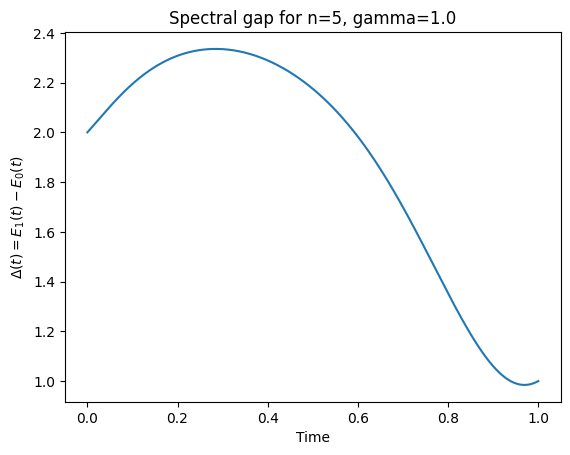

In [6]:
# Plot spectral gap evolution
plot_gap(
    gap=results['gap'][-1],  # last system size
    n=5,
    problem=custom_func.name,
    title_params={'gamma': 1.0}
)

### 3.4 Minimum Gap Analysis

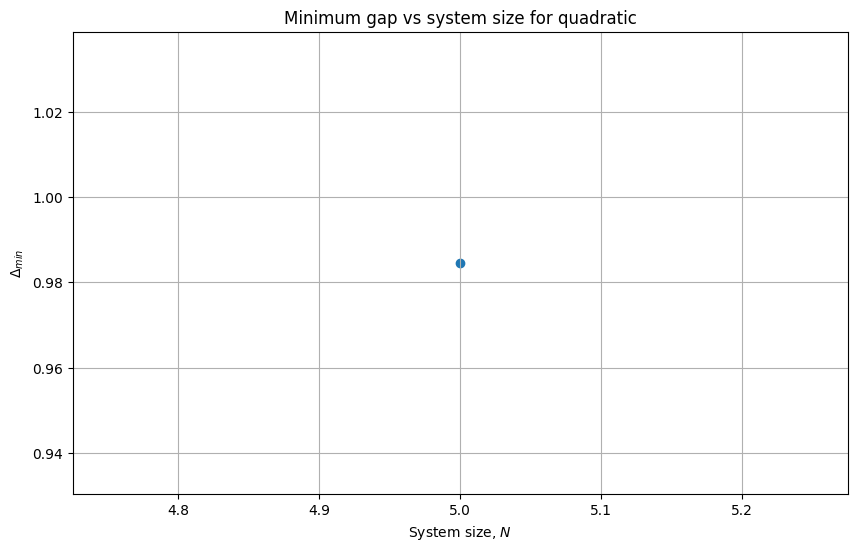

In [7]:
# Plot minimum gap vs system size
nlist = np.arange(5, 6)  # system sizes to analyze

plot_min_gap(
    results_file=results,
    nlist=nlist,
    problem=custom_func.name
)